In [1]:
import sys
sys.path.append("../../")

from astronn.preprocess import predeltascuti, precorot
from astronn.datasets import deltascuti, starmodels, corot
from astronn import models

import tensorflow as tf
#tf.compat.v1.disable_v2_behavior() 

import pandas as pd
import numpy as np
import shap

import matplotlib.pyplot as plt
from pygam import LinearGAM, s, f
from sklearn.mixture import GaussianMixture

from collections import Counter

Using TensorFlow backend.


#### Preprocess is not needed if data exists in beforehand

In [2]:
# Preprocess eleven delta scuti stars
if False:
    # Preprocess DS stars
    preprocessor = predeltascuti()
    preprocessor.preprocess_files(
        input_folder="../../astronn/data/deltascuti/raw/*",
        output_folder="../../astronn/data/deltascuti/preprocessed/",
    )

# Preprocess 77 CoRoT stars
if False:
    preprocessor = precorot(conf_file="../../astronn/data/corot/parameters.csv", cols=["corot", "loggs", "teff"])
    preprocessor.preprocess_files(
        input_folder="../../astronn/data/corot/raw/*",
        output_folder="../../astronn/data/corot/preprocessed/",
    )

In [3]:
star_models = starmodels()
df_sm = star_models.load("/home/roberto/Downloads/dataall_parts/*", batch_size=150, add_noise=True)

[[0.         0.01461943 0.        ]
 [0.         0.         0.        ]
 [0.         0.4877717  0.        ]
 ...
 [0.00868612 0.00135175 0.17237134]
 [0.         0.00389368 0.09457015]
 [0.03788841 0.         0.24277055]]


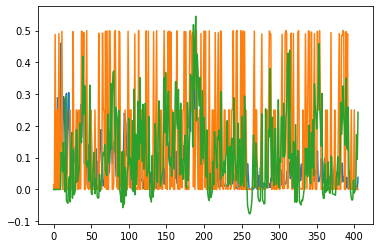

In [4]:

aux = None
for star in df_sm.take(1):  # take the 1 ds stars
    aux = star
    print(str(star[0].numpy()[0]))
x = aux[0].numpy()

plt.plot(x[0, :, 0])
plt.plot(x[0, :, 1])
plt.plot(x[0, :, 2])
plt.show()

#### Utils functions

In [5]:
def normalize(x):
    """
    """
    return (x - np.min(x)) / (np.max(x) - np.min(x))

# Custom metrics
def top_2_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=2)

def top_4_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=4)

def top_6_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=6)

def top_8_categorical_accuracy(y_true, y_pred):
    return tf.keras.metrics.top_k_categorical_accuracy(y_true, y_pred, k=8)

def calculate_shap_by_gradient(model, x_explain):
    """
    """
    e = shap.GradientExplainer(model, x_train, batch_size=1000, local_smoothing=0)
    shap_values, indexes = e.shap_values(x_explain, nsamples=10000, ranked_outputs=5)
    return shap_values, indexes

In [6]:
# Load best model (old train method)
sepconv_mod = tf.keras.models.load_model(
    "/home/roberto/Projects/asteroseismologyNN/models/model_dnu_noisy.h5",
    custom_objects={"rec_at_2": top_2_categorical_accuracy,
                    "rec_at_4": top_4_categorical_accuracy,
                    "recat_6": top_6_categorical_accuracy,
                    "rec_at_8": top_8_categorical_accuracy}
)

#### Process 11 ds stars, infer Dnu and calculate shap values explanations

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
separable_conv1d (SeparableC (None, 397, 10)           610       
_________________________________________________________________
batch_normalization (BatchNo (None, 397, 10)           40        
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 198, 10)           0         
_________________________________________________________________
separable_conv1d_1 (Separabl (None, 194, 10)           1510      
_________________________________________________________________
batch_normalization_1 (Batch (None, 194, 10)           40        
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 97, 10)            0         
_________________________________________________________________
separable_conv1d_2 (Separabl (None, 47, 10)            1

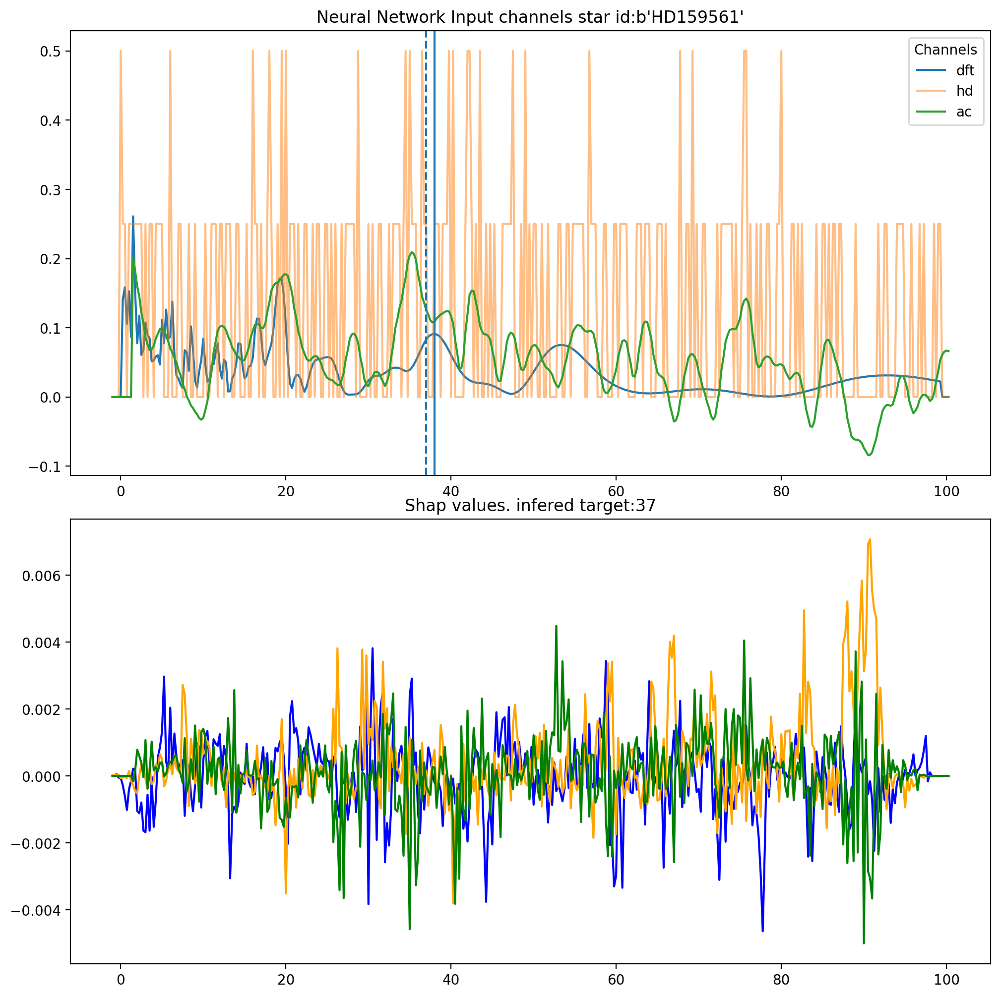

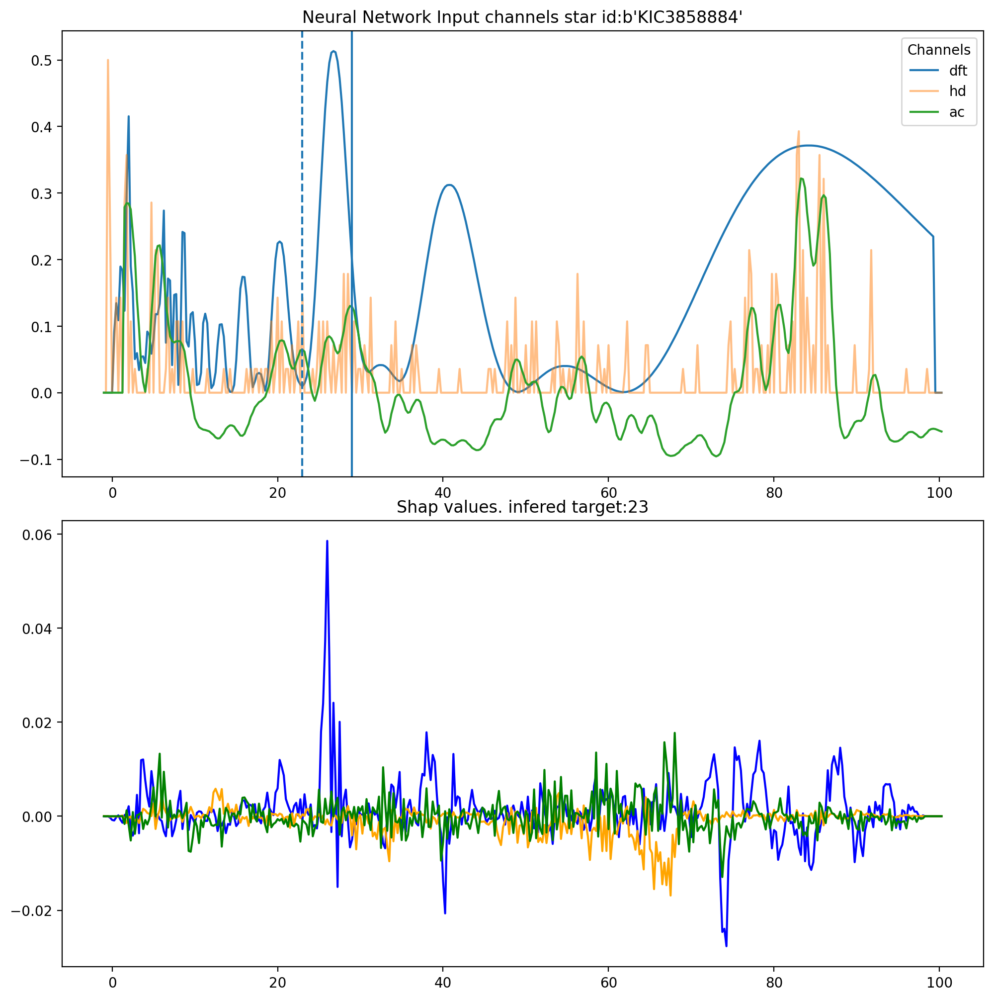

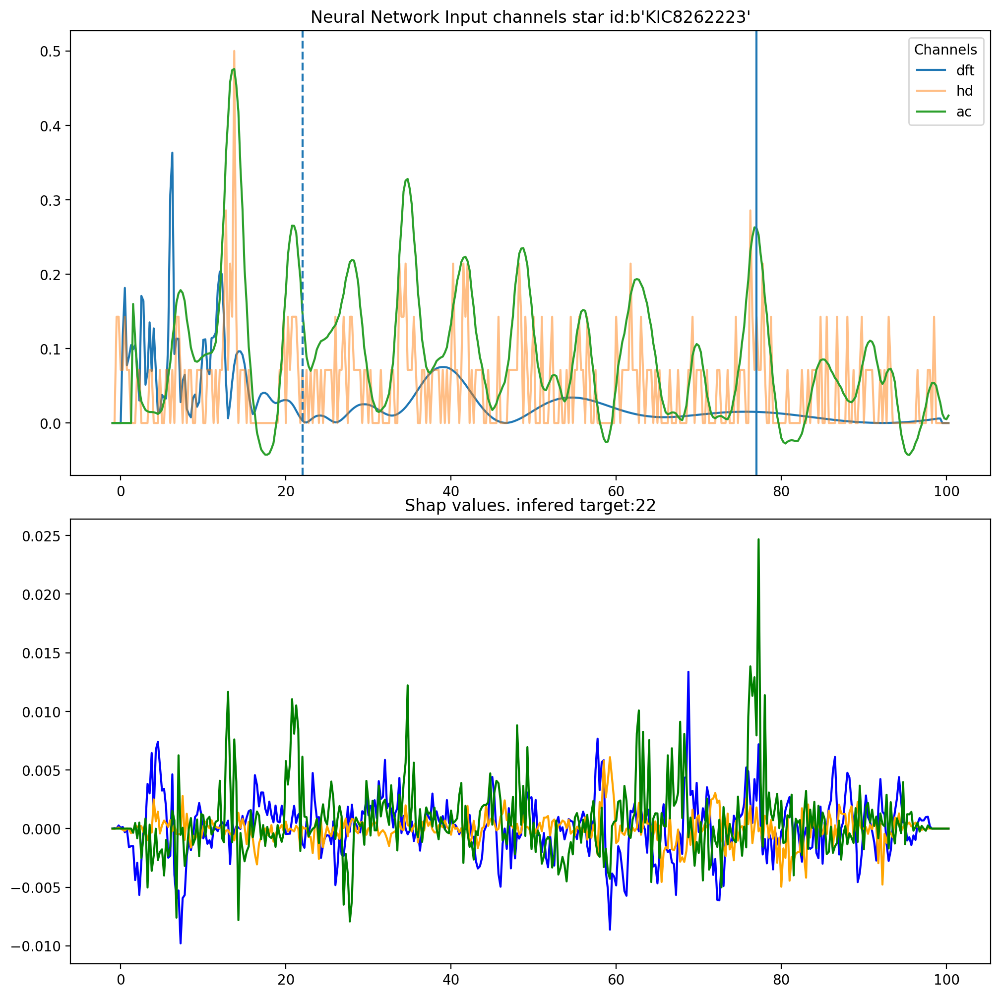

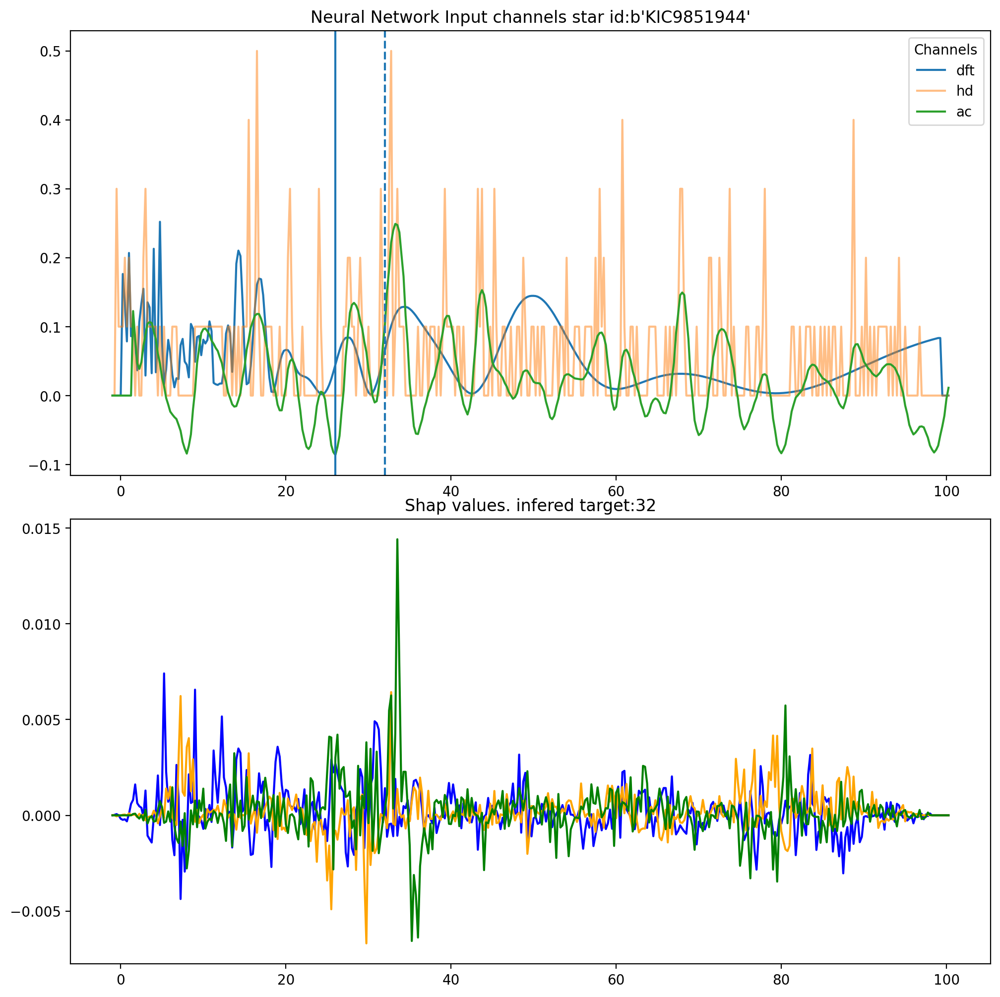

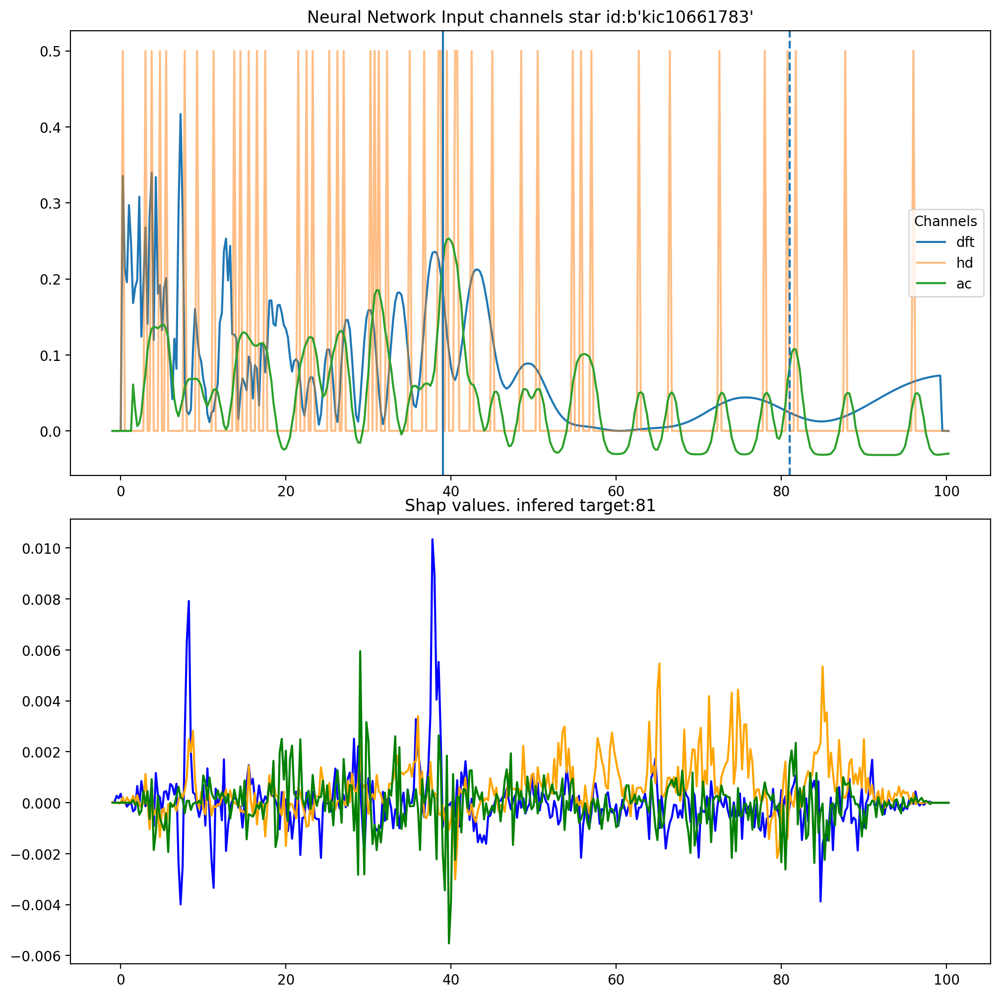

...

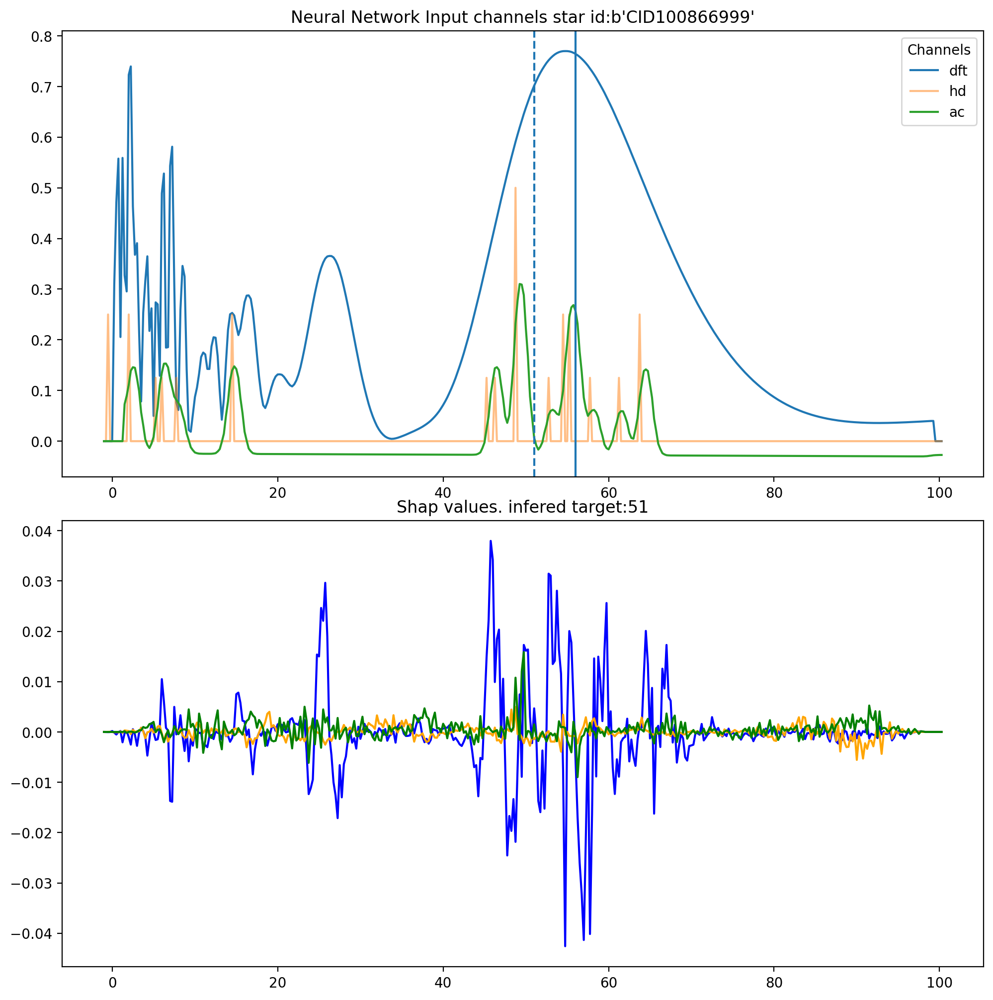

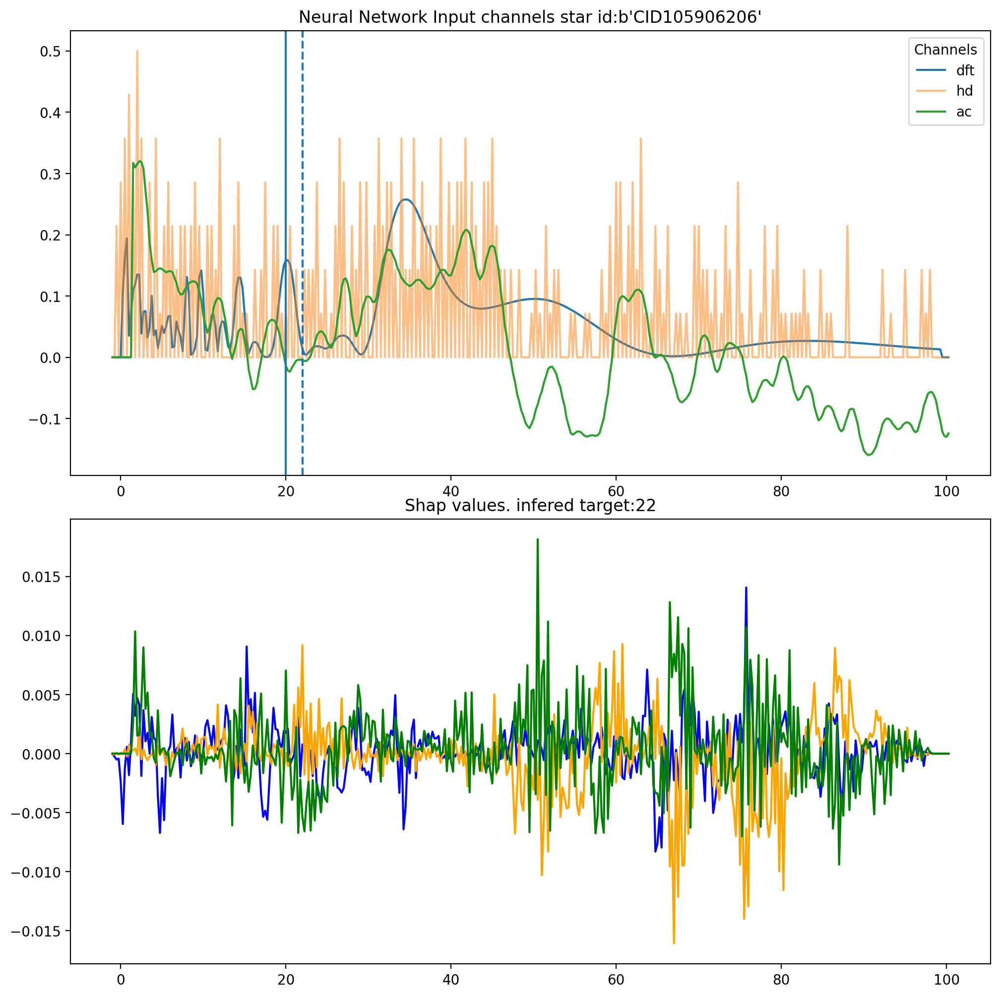

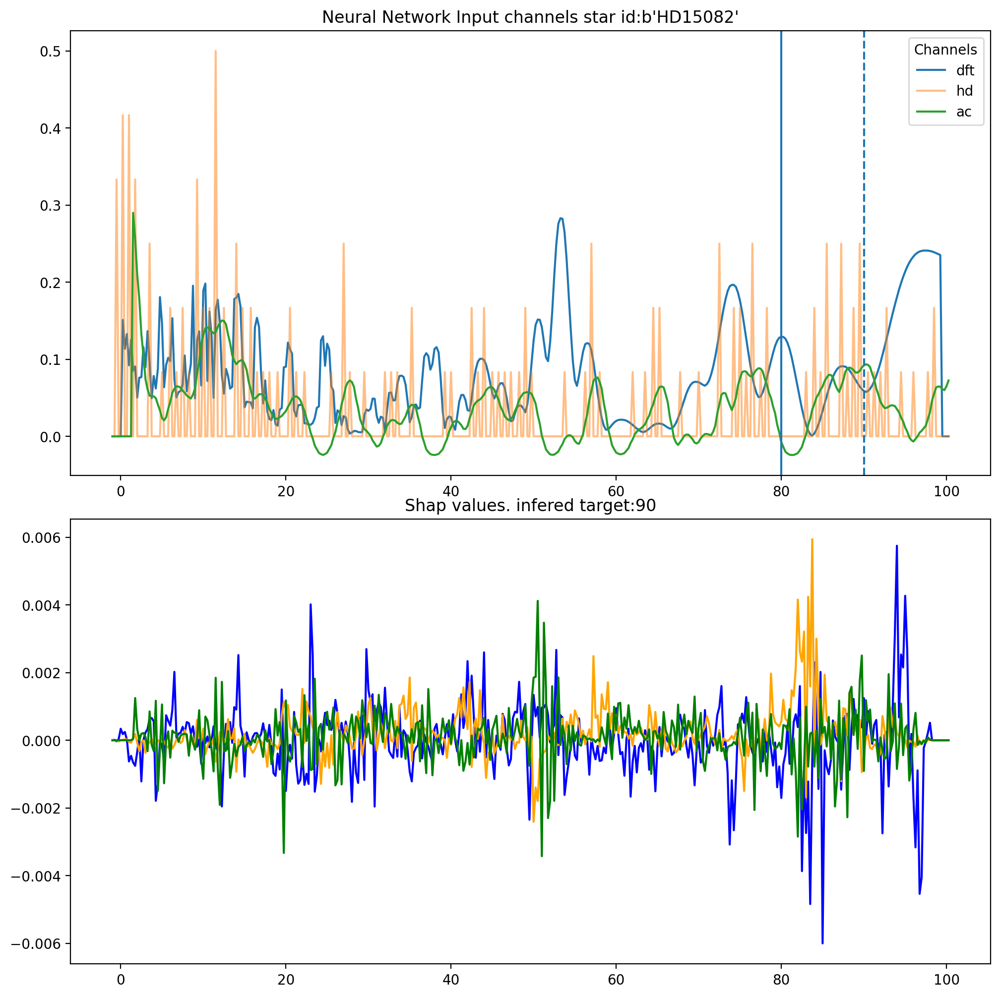

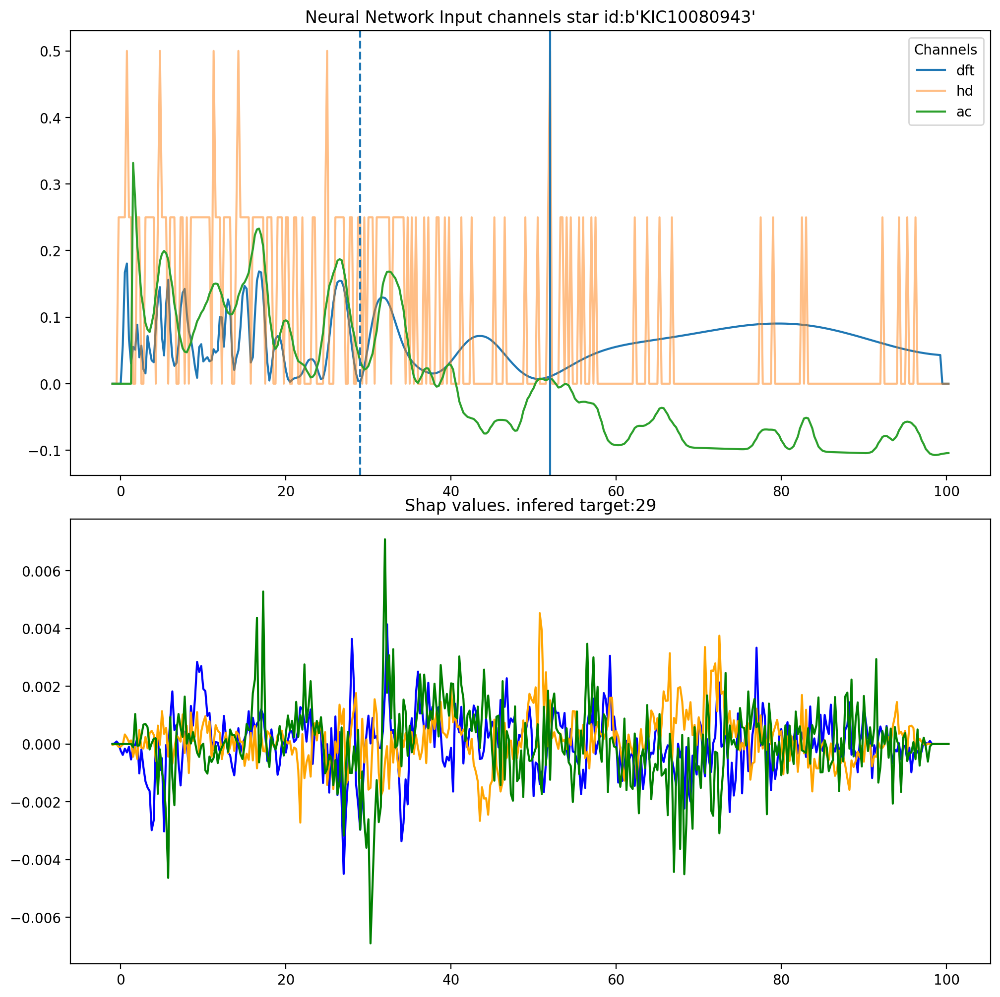

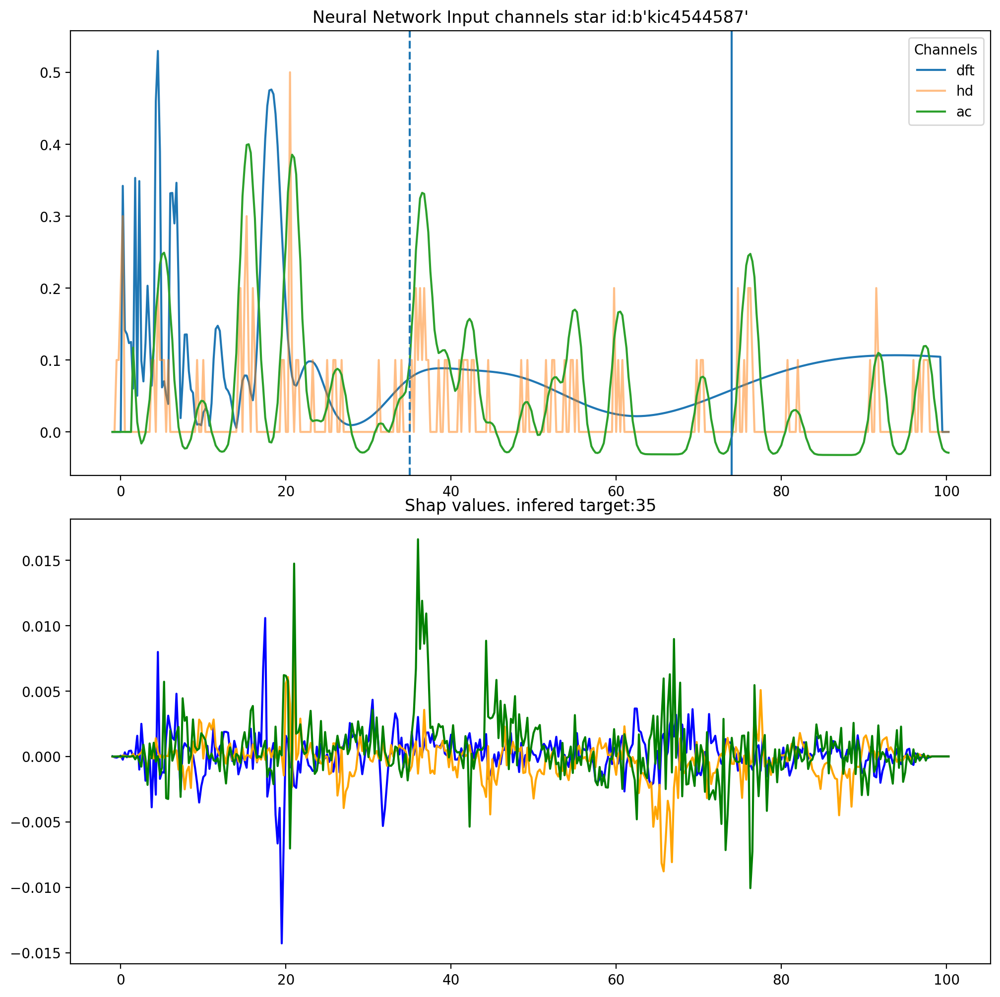

In [7]:
# Read datasets of preprocessed stars
df_ds = deltascuti()
df = df_ds.load("../../astronn/data/deltascuti/preprocessed/*", batch_size=1)
# Read star models (trainning) to calculate shap values
star_models = starmodels()
df_sm = star_models.load("/home/roberto/Downloads/dataall_parts/*", batch_size=150, add_noise=True)
_train_shap = np.asarray([line[0].numpy() for line in df_sm.take(10)])
_train_shap = _train_shap.reshape(
    (
        _train_shap.shape[0] * _train_shap.shape[1],
        _train_shap.shape[2],
        _train_shap.shape[3],
    )
)
number_shap_plots = 1
# Load model
sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_400/")
sepconv_mod.summary()

x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100

# Save results and predictions
results = {}
for star in df.take(11):  # take the 11 ds stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]

    # Plot information about ds star
    fig, subplots = plt.subplots(number_shap_plots+1, figsize=(10, 10), dpi=200)
    fig.tight_layout()

    subplots[0].plot(x, star[1][0, :, 0].numpy(), label="dft")
    subplots[0].plot(x, star[1][0, :, 1].numpy(), alpha=0.5, label="hd")
    subplots[0].plot(x, star[1][0, :, 2].numpy(), label="ac")
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]
    subplots[0].axvline(x=target)
    subplots[0].axvline(x=sepconv_mod.predict_classes(star[1]), linestyle="--")
    # Calculate gradient explainers and shap values
    e = shap.GradientExplainer(
        sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
    )
    shap_values, indexes = e.shap_values(
        star[1].numpy(), nsamples=100, ranked_outputs=10
    )
    print(str(star[0].numpy()[0]))
    print(indexes)
    print("")
    # Plot shap
    for idx in range(number_shap_plots):
        subplots[idx+1].plot(x, shap_values[idx][0][:, [0]], label="dft", linestyle="solid", color="blue")
        subplots[idx+1].plot(x, shap_values[idx][0][:, [1]], label="hd", linestyle="solid", color="orange")
        subplots[idx+1].plot(x, shap_values[idx][0][:, [2]], label="ac", linestyle="solid", color="green")
        subplots[idx+1].title.set_text("Shap values" + ". infered target:"+ str(indexes[0][idx]))

    subplots[0].legend(title="Channels")
    subplots[0].title.set_text("Neural Network Input channels" + " star id:" + str(star[0].numpy()[0]))
    fig.show()

    # Save results
    if str(star[0].numpy()[0]) not in results:
        results[str(star[0].numpy()[0])] = {"inference":sepconv_mod.predict_classes(star[1]), "target":target}

In [8]:
targets = []
ids = []
inferences = []
for star in results:
    ids.append(star)
    targets.append(results[star]["target"])
    inferences.append(results[star]["inference"])

Text(0, 0.5, 'NN Inference ($\\mu$Hz)')

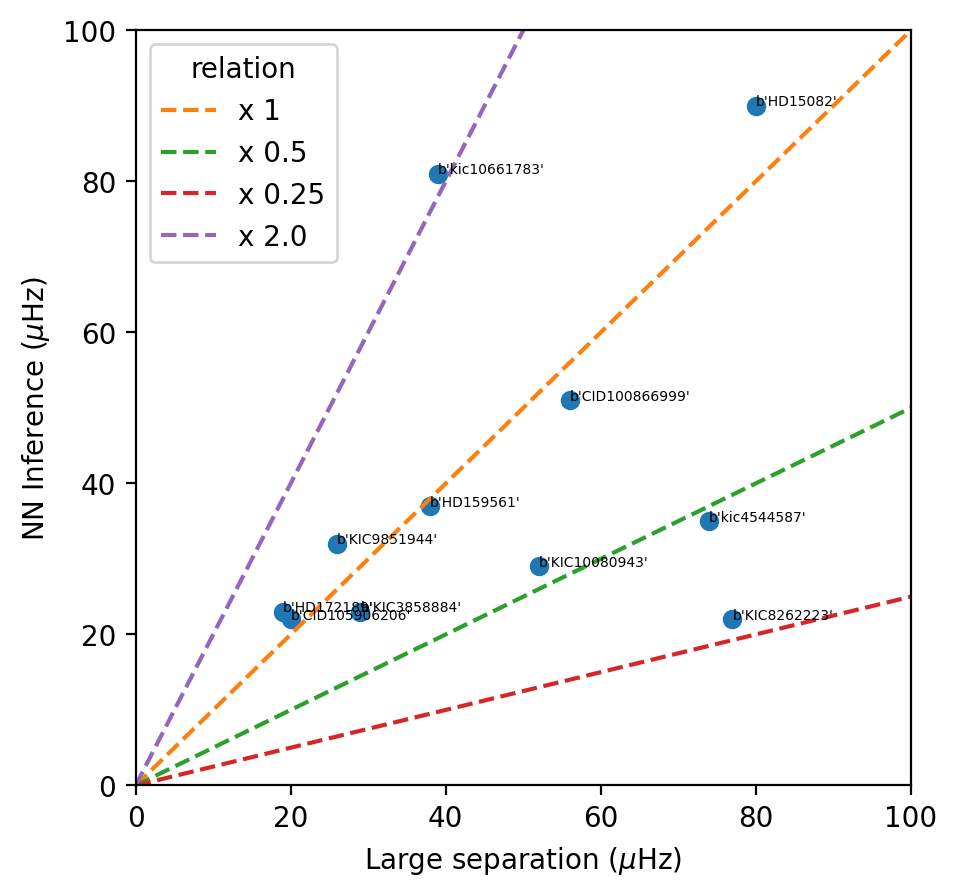

In [9]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--', label="x "+str(slope))
    
# Set lims
plt.subplots(1, figsize=(5, 5), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(2.0, 0)
plt.legend(title="relation")
plt.xlabel("Large separation ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")

In [10]:
cid = None
for star in df.take(11):  # take the 11 ds stars
    print(str(star[0].numpy()[0]))
    if star[0].numpy()[0].decode("utf-8") == 'CID100866999':
        cid = star

b'CID105906206'
b'CID100866999'
b'HD15082'
b'HD159561'
b'KIC3858884'
b'KIC8262223'
b'KIC9851944'
b'HD172189'
b'KIC10080943'
b'kic4544587'
b'kic10661783'


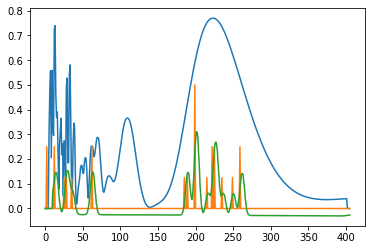

Instructions for updating:
Please use `model.predict()` instead.


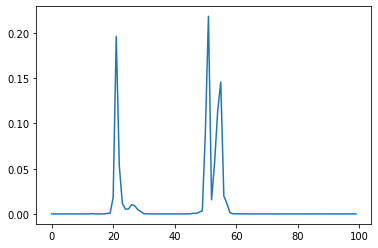

In [11]:
# Plot sample star
x = cid[1].numpy()

# Modify values
#x[0, 0:400, 0] = 0.5

plt.plot(x[0, :, 0])
plt.plot(x[0, :, 1])
plt.plot(x[0, :, 2])
plt.show()
plt.plot(sepconv_mod.predict_proba(x)[0][0:100])
plt.show()

## CoRoT 75 stars study

In [12]:
vrrhosun = 1.409
vrloggsun = 4.44

def getRhoFromDnu(Dnu, e_Dnu=0):
    """
    calculate Rho from Dnu estimating the error produced
    """
    rho_sun = 1.409
    dnu_sun = 134.8
    a = 1.501
    e_a = 0.096
    b = 2.0373
    e_b = 0.0405
    rho = (a * (Dnu / dnu_sun) ** b) * rho_sun
    e_rho = rho * np.sqrt(
        (e_a / a) ** 2
        + (b * e_Dnu / (Dnu * dnu_sun)) ** 2
        + (np.log10(Dnu / dnu_sun) * e_b) ** 2
    )
    return {"rho": rho, "error": e_rho}


def get_radio_from_rho(rho, e_rho):
    """
    calculate radio from rho, estimating max and min values
    """
    R_min = (1.5 / (rho + e_rho) / vrrhosun) ** (1 / 3)
    R_max = (3 / (rho - e_rho) / vrrhosun) ** (1 / 3)
    return {"r_min": R_min, "r_max": R_max}


def get_logg_from_radio(R_max, R_min):
    """
    calculate logg from radio estimating max and min values
    """
    logg_min = np.log10(1.5 / R_max ** 2) + vrloggsun
    logg_max = np.log10(3 / R_min ** 2) + vrloggsun
    return {"logg_min": logg_min, "logg_max": logg_max}

# Test
rhos = getRhoFromDnu(26, 4)
radios = get_radio_from_rho(rhos["rho"], rhos["error"])
loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
print(loggs_average)
print(loggs_condifence)

3.893559849137816
{'logg_min': 3.622331070953697, 'logg_max': 4.1647886273219346}


In [13]:
def get_logg_confidence(dnu_hat):
    """
    """
    rhos = getRhoFromDnu(dnu_hat, 4)
    radios = get_radio_from_rho(rhos["rho"], rhos["error"])
    loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
    # Get central point of logg confidence
    loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
    return loggs_condifence

CoRoT ID: 102728240
Shap values (sorted): [[33 34 32 31 30 36 35 37 29 38 28 27 39 26 40 25 24 41 46 23 51 22 50 42
  44 47 49 45 48 43 21 52 20 53 19 55 63 62 18 54]]
Logg from Hareter: 4.2
Avg logg from NN: [4.03422174]
Confidence logg from NN: {'logg_min': array([3.76346909]), 'logg_max': array([4.30497439])}
Logg from Hareter is inside NN confidence=: [ True]
[[50.48778226]
 [24.08747385]
 [37.00482962]]
{'logg_min': array([4.01501909]), 'logg_max': array([4.55516034])}
{'logg_min': array([3.57708538]), 'logg_max': array([4.11987506])}
{'logg_min': array([3.83125139]), 'logg_max': array([4.37234599])}


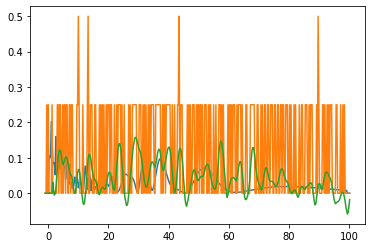

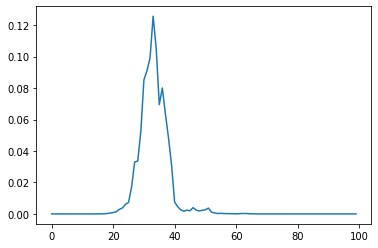

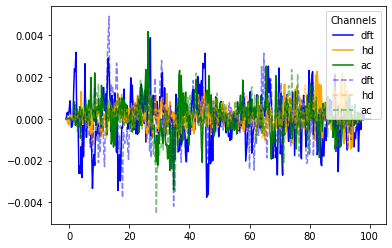



CoRoT ID: 102690176
Shap values (sorted): [[22 20 23 21 30 29 32 24 25 35 34 19 36 28 31 27 33 40 26 39 38 37 41 42
  43 18 49 44 47 45 48 51 46 50 52 55 17 53 56 54]]
Logg from Hareter: 3.525
Avg logg from NN: [3.79499522]
Confidence logg from NN: {'logg_min': array([3.52339513]), 'logg_max': array([4.0665953])}
Logg from Hareter is inside NN confidence=: [ True]
[[50.32958136]
 [24.19660053]
 [37.99044832]]
{'logg_min': array([4.01316341]), 'logg_max': array([4.55331308])}
{'logg_min': array([3.57976237]), 'logg_max': array([4.12253204])}
{'logg_min': array([3.84680458]), 'logg_max': array([4.38780934])}


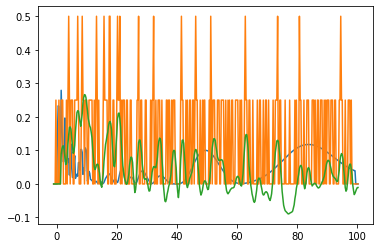

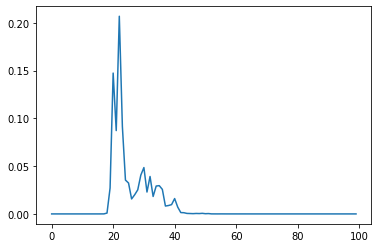

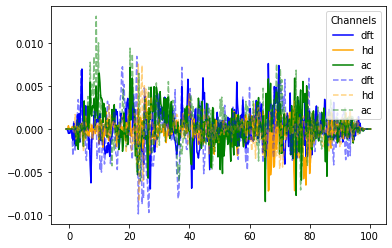



CoRoT ID: 102639464
Shap values (sorted): [[73 71 72 74 70 75 76 56 57 69 55 83 58 77 84 96 97 82 59 68 61 62 60 81
  66 79 78 54 85 90 92 65 67 98 80 99 95 89 53 93]]
Logg from Hareter: 3.9
Avg logg from NN: [4.50261377]
Confidence logg from NN: {'logg_min': array([4.23294838]), 'logg_max': array([4.77227916])}
Logg from Hareter is inside NN confidence=: [False]
[[57.19988461]
 [94.93855865]
 [75.01165349]]
{'logg_min': array([4.08881313]), 'logg_max': array([4.62864])}
{'logg_min': array([4.38813436]), 'logg_max': array([4.927111])}
{'logg_min': array([4.2490073]), 'logg_max': array([4.78829267])}


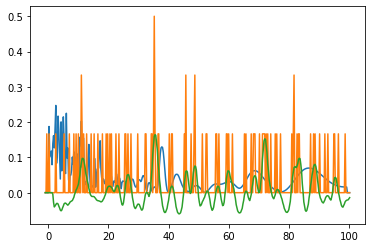

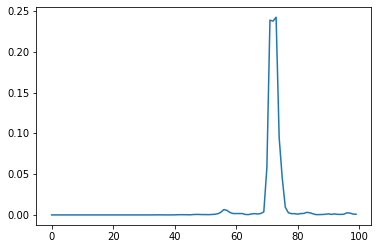

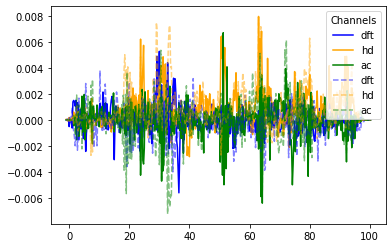



CoRoT ID: 102642516
Shap values (sorted): [[34 58 35 57 36 55 56 33 62 69 61 63 73 37 68 70 60 67 72 59 32 74 75 76
  38 71 66 65 54 64 31 53 29 30 39 52 77 79 78 51]]
Logg from Hareter: 3.7
Avg logg from NN: [4.05183454]
Confidence logg from NN: {'logg_min': array([3.7811369]), 'logg_max': array([4.32253217])}
Logg from Hareter is inside NN confidence=: [False]
[[58.25049876]
 [33.99958981]
 [72.25465364]]
{'logg_min': array([4.09957164]), 'logg_max': array([4.63935605])}
{'logg_min': array([3.78112976]), 'logg_max': array([4.32252508])}
{'logg_min': array([4.22688543]), 'logg_max': array([4.76623387])}


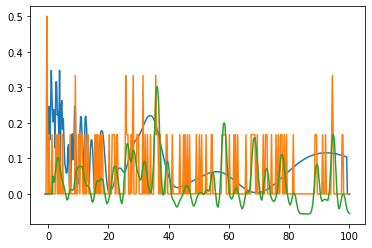

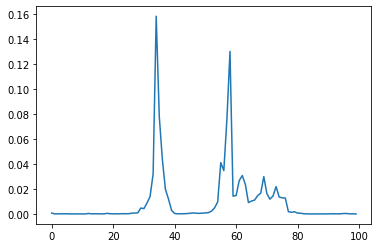

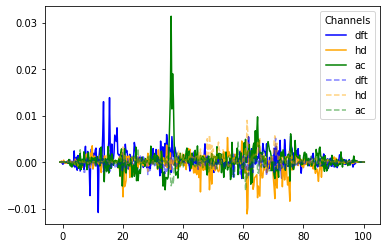



CoRoT ID: 102710813
Shap values (sorted): [[47 48 49 50 27 28 46 29 26 45 43 44 51 25 39 57 58 38 37 42 41 59 33 30
  19 22 61 76 32 75 62 23 53 54 52 31 40 21 60 18]]
Logg from Hareter: 4.15
Avg logg from NN: [4.24285882]
Confidence logg from NN: {'logg_min': array([3.97268903]), 'logg_max': array([4.51302861])}
Logg from Hareter is inside NN confidence=: [ True]
[[60.26638643]
 [45.82586937]
 [25.87433667]]
{'logg_min': array([4.11968077]), 'logg_max': array([4.65938814])}
{'logg_min': array([3.95772725]), 'logg_max': array([4.49814002])}
{'logg_min': array([3.61946218]), 'logg_max': array([4.16194042])}


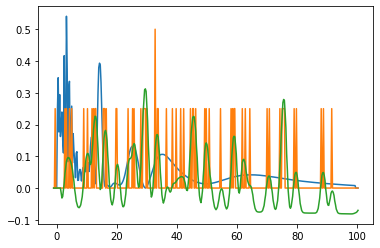

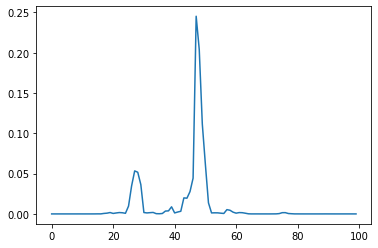

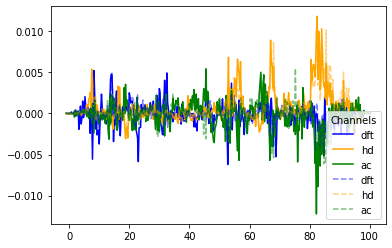



CoRoT ID: 102702932
Shap values (sorted): [[21 22 20 25 26 24 27 23 28 29 19 30 31 32 33 34 18 35 36 37 39 38 40 41
  43 42 44 45 47 46 48 49 17 16 50 51 53 14 52 13]]
Logg from Hareter: 3.35
Avg logg from NN: [3.76754718]
Confidence logg from NN: {'logg_min': array([3.49583836]), 'logg_max': array([4.039256])}
Logg from Hareter is inside NN confidence=: [False]
[[47.32238648]
 [20.69013736]
 [34.58189243]]
{'logg_min': array([3.97673162]), 'logg_max': array([4.5170517])}
{'logg_min': array([3.48703216]), 'logg_max': array([4.03052026])}
{'logg_min': array([3.79117953]), 'logg_max': array([4.33251319])}


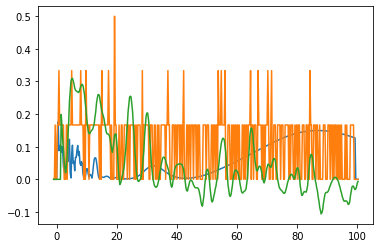

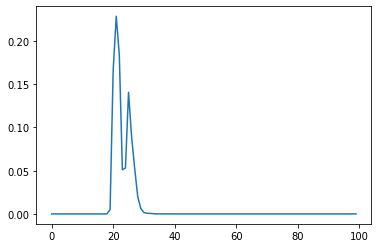

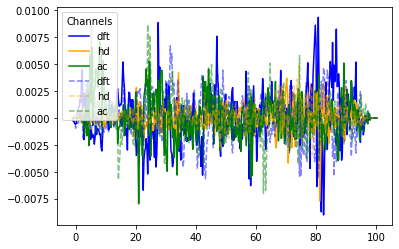



CoRoT ID: 102688156
Shap values (sorted): [[96 95 97 92 94 91 93 98 43 44 48 45 47 90 72 83 71 89 68 46 42 69 70 73
  99 49 81 74 82 84 67 50 66 79 62 41 58 85 65 56]]
Logg from Hareter: 4.4
Avg logg from NN: [4.66418123]
Confidence logg from NN: {'logg_min': array([4.3946983]), 'logg_max': array([4.93366416])}
Logg from Hareter is inside NN confidence=: [ True]
[[67.95205531]
 [90.38969635]
 [45.48739938]]
{'logg_min': array([4.19061201]), 'logg_max': array([4.73007205])}
{'logg_min': array([4.35914498]), 'logg_max': array([4.89817334])}
{'logg_min': array([3.95334278]), 'logg_max': array([4.4937773])}


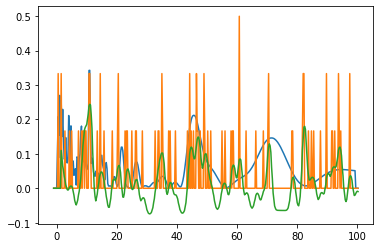

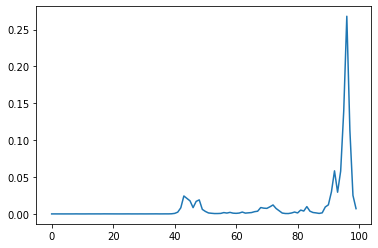

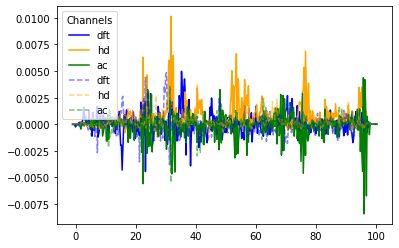



CoRoT ID: 102584233
Shap values (sorted): [[77 79 78 75 85 76 87 97 83 93 86 80 84 89 98 81 88 94 82 74 96 73 91 71
  70 99 72 90 95 92  3 66 12 62 14 65 69 64  9  7]]
Logg from Hareter: 3.725
Avg logg from NN: [4.53408319]
Confidence logg from NN: {'logg_min': array([4.2644614]), 'logg_max': array([4.80370498])}
Logg from Hareter is inside NN confidence=: [False]
[[73.70533509]
 [ 9.        ]
 [90.85464306]]
{'logg_min': array([4.23862898]), 'logg_max': array([4.77794347])}
{'logg_min': array([2.99350761]), 'logg_max': array([3.54165535])}
{'logg_min': array([4.36217436]), 'logg_max': array([4.901197])}


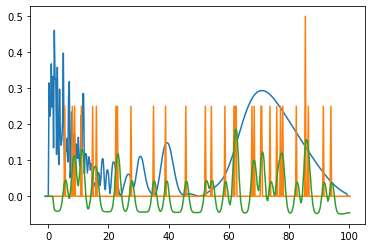

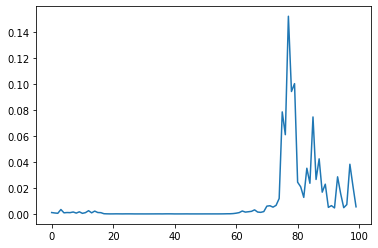

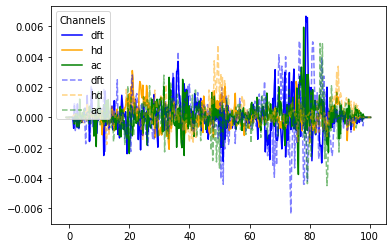



CoRoT ID: 102675756
Shap values (sorted): [[21 20 22 23 24 25 26 27 28 19 29 18 32 41 30 34 33 39 37 36 38 40 31 35
  42 43 17 44 16 47 14 45 46 49 48 53 51 50 12 55]]
Logg from Hareter: 3.175
Avg logg from NN: [3.76754718]
Confidence logg from NN: {'logg_min': array([3.49583836]), 'logg_max': array([4.039256])}
Logg from Hareter is inside NN confidence=: [False]
[[47.29709753]
 [20.7047689 ]
 [34.47213291]]
{'logg_min': array([3.97641551]), 'logg_max': array([4.51673711])}
{'logg_min': array([3.48745095]), 'logg_max': array([4.03093569])}
{'logg_min': array([3.78929826]), 'logg_max': array([4.33064341])}


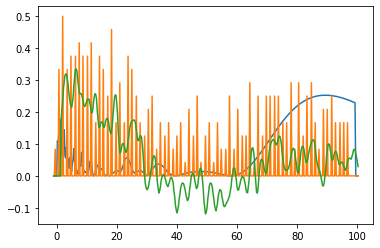

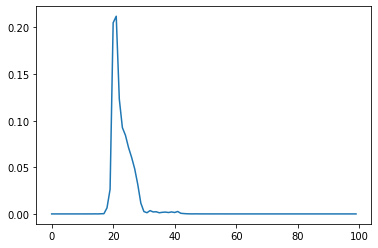

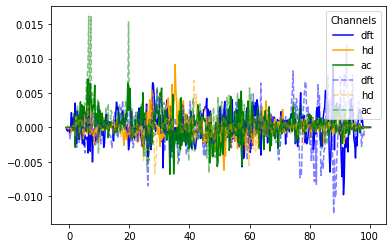



CoRoT ID: 102743992
Shap values (sorted): [[98 99 97 95 96 93 94 86 83 85 84 82 63 92 75 90 87 48 62 89 70 91 64 88
  67 58 81 49 61 47 59 68 79 76 60 74 66 50 73 80]]
Logg from Hareter: 4.3
Avg logg from NN: [4.67634431]
Confidence logg from NN: {'logg_min': array([4.40687092]), 'logg_max': array([4.9458177])}
Logg from Hareter is inside NN confidence=: [False]
[[80.91287582]
 [60.5470645 ]
 [92.97675906]]
{'logg_min': array([4.29373869]), 'logg_max': array([4.83290818])}
{'logg_min': array([4.12242702]), 'logg_max': array([4.6621241])}
{'logg_min': array([4.37580662]), 'logg_max': array([4.91480444])}


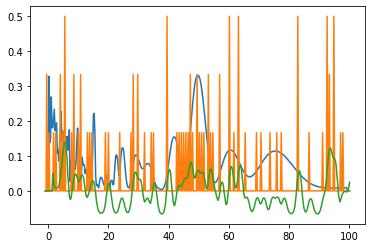

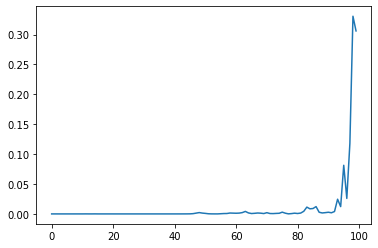

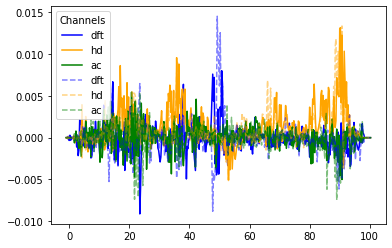

In [14]:
# Read datasets of preprocessed stars
df_cor = corot()
dfcor = df_cor.load("../../astronn/data/corot/preprocessed/*.log", batch_size=1)

count = 0
# DS to save logg_g compatibles
aux = []
aux_topk_comp = []
# Other variables to save third results
_x = []
_y = []
_y_topk = []
_l = [] #luminosity
_star_id = []
for star in dfcor.take(75):  # take the 75 corot stars

    #if star[0].numpy()[0].decode("utf-8") == "102587554":
    if True:
        # Star channels info
        x_star = star[1].numpy()
        # Star logg from data
        logg_data = star[2][0].numpy()
        l = star[3][0].numpy()
        _l.append(l)
        _star_id.append(star[0].numpy()[0].decode("utf-8"))

        # Dnu NN inference
        dnu_hat = sepconv_mod.predict_classes(star[1])

            
        # Calculate logg from Dnu infered by the NN
        rhos = getRhoFromDnu(dnu_hat, 4)
        radios = get_radio_from_rho(rhos["rho"], rhos["error"])
        loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
        # Get central point of logg confidence
        loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2

        # Append data for posterior analysis
        _x.append(logg_data)
        _y.append(loggs_average[0])

        # Flag to point out if logg from data is inside the confidence interval
        flag = (
            logg_data <= loggs_condifence["logg_max"]
            and logg_data >= loggs_condifence["logg_min"]
        )
        aux.append(flag) # save

        # Flag to point if real value are into one component
        # Calculate gradient explainers and shap values
        e = shap.GradientExplainer(
            sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
        )
        shap_values, indexes = e.shap_values(
            x_star, nsamples=100, ranked_outputs=40
        )

        # GMM on first NN outputs (using shap indexm that provides the same order) with three fixed components
        gmm = GaussianMixture(n_components=3).fit(indexes[0].reshape(-1, 1))
        labels = gmm.predict(indexes[0].reshape(-1, 1))
        # Calculate confidences for three first components
        loggs_confidence_aux = get_logg_confidence(gmm.means_[0])
        flag1 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
        if flag1:
            _y_topk.append((get_logg_confidence(gmm.means_[0])["logg_min"][0] + get_logg_confidence(gmm.means_[0])["logg_max"][0]) / 2)
        loggs_confidence_aux = get_logg_confidence(gmm.means_[1])
        flag2 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
        if flag2 and not flag1:
            _y_topk.append((get_logg_confidence(gmm.means_[1])["logg_min"][0] + get_logg_confidence(gmm.means_[1])["logg_max"][0]) / 2)
        loggs_confidence_aux = get_logg_confidence(gmm.means_[2])
        flag3 = logg_data <= loggs_confidence_aux["logg_max"] and logg_data >= loggs_confidence_aux["logg_min"]
        if flag3 and not flag1 and not flag2:
            _y_topk.append((get_logg_confidence(gmm.means_[2])["logg_min"][0] + get_logg_confidence(gmm.means_[2])["logg_max"][0]) / 2)
        # Else
        if not flag3 and not flag1 and not flag2:
            _y_topk.append(loggs_average[0])
        # Append results
        aux_topk_comp.append(flag1 or flag2 or flag3)

        # Plot graphs and info (debug)
        if True and count < 10:
            # Calculate gradient explainers and shap values
            e = shap.GradientExplainer(
                sepconv_mod, _train_shap, batch_size=10, local_smoothing=0
            )
            shap_values, indexes = e.shap_values(
                star[1].numpy(), nsamples=100, ranked_outputs=40
            )

            # Log info
            print("CoRoT ID:",star[0].numpy()[0].decode("utf-8"))
            print("Shap values (sorted):",indexes)
            print("Logg from Hareter:",logg_data)
            print("Avg logg from NN:",loggs_average)
            print("Confidence logg from NN:",loggs_condifence)
            print("Logg from Hareter is inside NN confidence=:",flag)

            gmm = GaussianMixture(n_components=3).fit(indexes[0].reshape(-1, 1))
            labels = gmm.predict(indexes[0].reshape(-1, 1))
            print(gmm.means_)
            def get_logg_confidence(dnu_hat):
                """
                """
                rhos = getRhoFromDnu(dnu_hat, 4)
                radios = get_radio_from_rho(rhos["rho"], rhos["error"])
                loggs_condifence = get_logg_from_radio(radios["r_max"], radios["r_min"])
                # Get central point of logg confidence
                loggs_average = (loggs_condifence["logg_max"] + loggs_condifence["logg_min"]) / 2
                return loggs_condifence
            print(get_logg_confidence(gmm.means_[0]))
            print(get_logg_confidence(gmm.means_[1]))
            print(get_logg_confidence(gmm.means_[2]))

            # Plot star
            x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100
            plt.plot(x, x_star[0, :, 0])
            plt.plot(x, x_star[0, :, 1])
            plt.plot(x, x_star[0, :, 2])
            plt.show()
            plt.plot(sepconv_mod.predict_proba(x_star)[0][0:100])
            plt.show()

            # Plot shap
            
            plt.plot(x, shap_values[0][0][:, [0]], label="dft", linestyle="solid", color="blue")
            plt.plot(
                x, shap_values[0][0][:, [1]], label="hd", linestyle="solid", color="orange"
            )
            plt.plot(x, shap_values[0][0][:, [2]], label="ac", linestyle="solid", color="green")
            plt.plot(
                x,
                shap_values[1][0][:, [0]],
                label="dft",
                linestyle="--",
                color="blue",
                alpha=0.5,
            )
            plt.plot(
                x,
                shap_values[1][0][:, [1]],
                label="hd",
                linestyle="--",
                color="orange",
                alpha=0.5,
            )
            plt.plot(
                x,
                shap_values[1][0][:, [2]],
                label="ac",
                linestyle="--",
                color="green",
                alpha=0.5,
            )

            plt.legend(title="Channels")
            plt.show()
            print("\n")

    count += 1

In [15]:
print("Compatible cases top-1")
print(Counter([e[0] for e in aux]))

print("Compatible cases top-k")
print(Counter([e[0] for e in aux_topk_comp]))

Compatible cases top-1
Counter({False: 38, True: 37})
Compatible cases top-k
Counter({True: 49, False: 26})


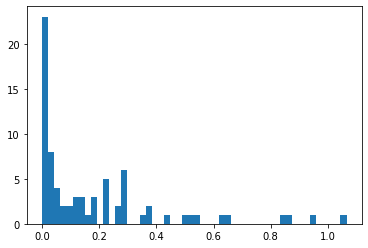

In [16]:
_ = plt.hist(np.power(np.asarray(_y)-np.asarray(_x), 2), bins=50)

(array([ 1.,  1.,  1.,  0.,  0.,  0.,  0.,  5.,  6., 11.,  7., 10.,  6.,
         3.,  8.,  3.,  1.,  3.,  2.,  0.,  0.,  1.,  1.,  0.,  0.,  2.,
         1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 6000.,  6136.,  6272.,  6408.,  6544.,  6680.,  6816.,  6952.,
         7088.,  7224.,  7360.,  7496.,  7632.,  7768.,  7904.,  8040.,
         8176.,  8312.,  8448.,  8584.,  8720.,  8856.,  8992.,  9128.,
         9264.,  9400.,  9536.,  9672.,  9808.,  9944., 10080., 10216.,
        10352., 10488., 10624., 10760., 10896., 11032., 11168., 11304.,
        11440., 11576., 11712., 11848., 11984., 12120., 12256., 12392.,
        12528., 12664., 12800.], dtype=float32),
 <a list of 50 Patch objects>)

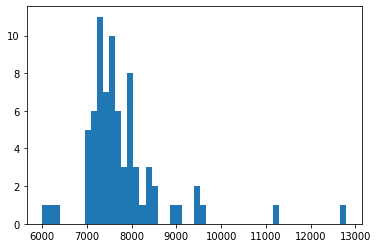

In [17]:
plt.hist(_l, bins=50) # plot Luminosity

## Error analysis

### Top-1. Most probable value

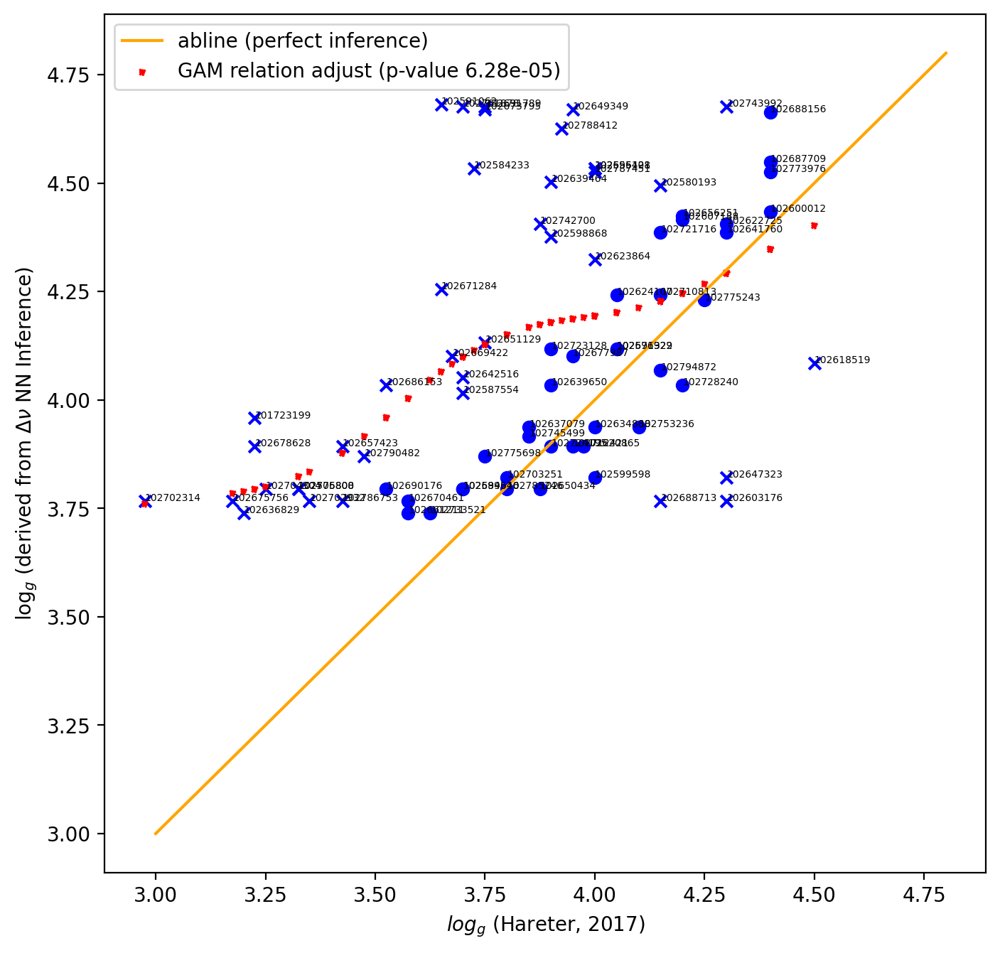

In [18]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y)

# Scatter all "residuals"
fig = plt.subplots(1, figsize=(8, 8), dpi=200)
for i in range(len(_x)):
    if aux[i]:
        mark = "o"  # compatible
    else:
        mark = "x"  # no-compatible
    plt.scatter(_x[i], _y[i], marker=mark, color="blue")
# Plot model
plt.scatter(
    _x,
    gam.predict(_x),
    c="red",
    marker=".",
    linestyle=":",
    label="GAM relation adjust (p-value 6.28e-05)",
)
for i, txt in enumerate(_star_id):
    plt.annotate(txt, (_x[i], _y[i]), size=5)

# Add abline(0,1)
x = np.linspace(3.0, 4.8, 10)
plt.plot(x, x + 0, linestyle="solid", c="orange", label="abline (perfect inference)")
plt.legend(title="")
plt.xlabel("$log_g$ (Hareter, 2017)")
plt.ylabel("$\log_g$ (derived from $\Delta\\nu$ NN Inference)")
plt.show()

### Top-K. Most probable value

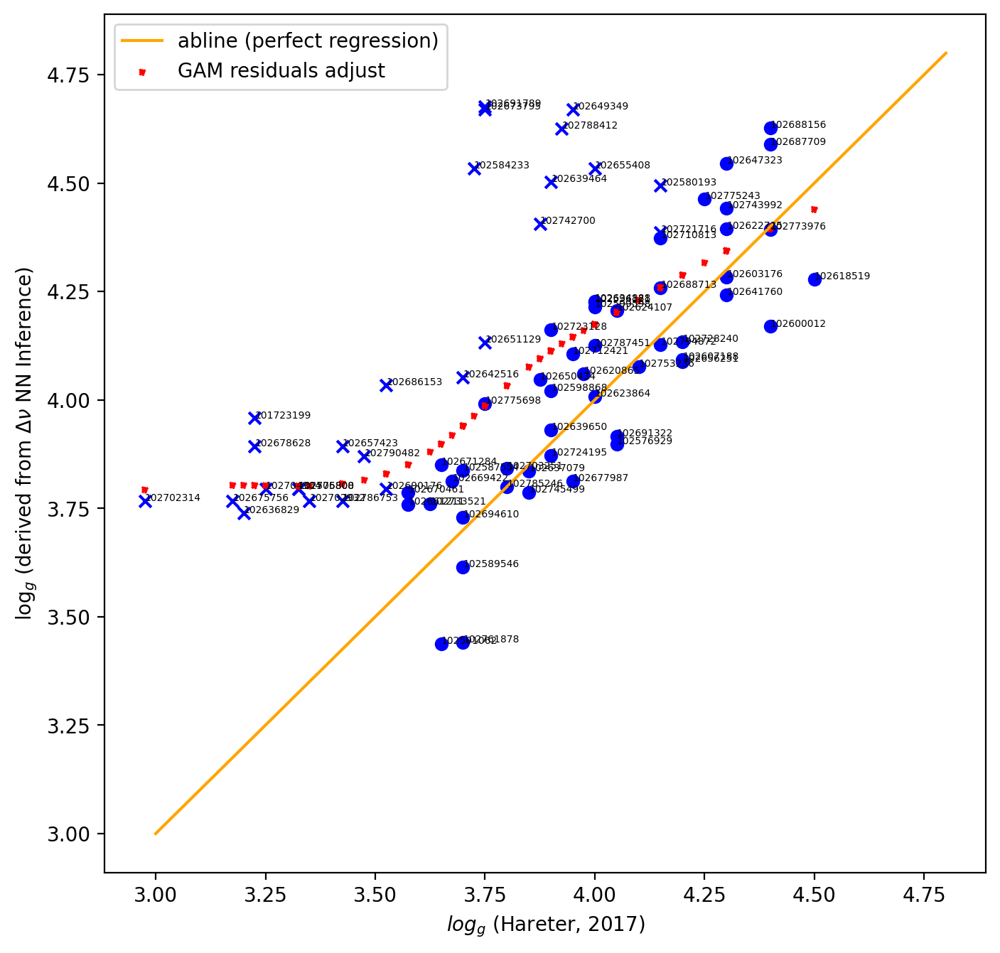

In [19]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y_topk)

# Scatter all "residuals"
fig = plt.subplots(1, figsize=(8, 8), dpi=200)
for i in range(len(_x)):
    if aux_topk_comp[i]:
        mark = "o"  # compatible
    else:
        mark = "x"  # no-compatible
    plt.scatter(_x[i], _y_topk[i], marker=mark, color="blue")
# Plot model
plt.scatter(
    _x,
    gam.predict(_x),
    c="red",
    marker=".",
    linestyle=":",
    label="GAM residuals adjust",
)
for i, txt in enumerate(_star_id):
    plt.annotate(txt, (_x[i], _y_topk[i]), size=5)

# Add abline(0,1)
x = np.linspace(3.0, 4.8, 10)
plt.plot(x, x + 0, linestyle="solid", c="orange", label="abline (perfect regression)")
plt.legend(title="")
plt.xlabel("$log_g$ (Hareter, 2017)")
plt.ylabel("$\log_g$ (derived from $\Delta\\nu$ NN Inference)")
plt.show()

In [20]:
gam = LinearGAM(n_splines=10)
gam.fit(_x, _y_topk)
gam.summary()

gam = LinearGAM(n_splines=10)
gam.fit(_x, _y)
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      5.1114
Link Function:                     IdentityLink Log Likelihood:                                  -449.8363
Number of Samples:                           75 AIC:                                              911.8953
                                                AICc:                                             913.1757
                                                GCV:                                                0.0671
                                                Scale:                                              0.0589
                                                Pseudo R-Squared:                                    0.411
Feature Function                  Lam